In [2]:
import warnings # 경고 메시지를 출력하지 않게 하기 위해 improt
warnings.filterwarnings("ignore") # 경고 메시지를 출력하지 않게 한다.
import numpy as np # 수치 계산, 배열 처리를 위해 import 한다.
import pandas as pd # 데이터 분석을 위한 전처리를 위해 import 한다.
import matplotlib as mpl # matplotlib에서 음수 데이터의 '-' 부호가 깨지는 것을 방지하기 위해 import한다.
mpl.rcParams['axes.unicode_minus'] = False # matplotlib에서 음수 데이터의 '-' 부호가 깨지는 것을 방지한다.
import matplotlib.pyplot as plt # 시각화를 하기 위해 import한다.
plt.rcParams["font.family"] = "Pretendard" # matplotlib에서 사용할 글꼴을 지정한다.
plt.rcParams["font.size"] = 10 # matplotlib에서 사용할 글꼴 크기를 지정한다.
import seaborn as sns # 시각화를 하기 위해 import한다. matplotlib 기반으로 만든 시각화 도구
from plotnine import * # R의 ggplot2 패키지를 사용하는 것처럼 만드는 시각화 도구를 import한다.
import missingno as msno # 누락값의 분포를 그래프 형태로 표현한다.
import folium

In [3]:
seoul_metro = pd.read_csv('./data/seoul_metro.csv', encoding='cp949')
seoul_metro

,철도운영기관명,선명,역명,지번주소,도로명주소
0,서울교통공사,1호선,동대문,서울특별시 종로구 창신동 492-1 동대문역(1호선),서울특별시 종로구 종로 지하302(창신동)
1,서울교통공사,1호선,동묘앞,서울특별시 종로구 숭인동 117 동묘앞역(1호선),서울특별시 종로구 종로 359(숭인동)
2,서울교통공사,1호선,서울역,서울특별시 중구 남대문로5가 73-6 서울역(1호선),서울특별시 중구 세종대로 지하2(남대문로 5가)
3,서울교통공사,1호선,시청,서울특별시 중구 정동 5-5 시청역(1호선),서울특별시 중구 세종대로 지하101(정동)
4,서울교통공사,1호선,신설동,서울특별시 동대문구 신설동 76-5 신설동역(1호선),서울특별시 동대문구 왕산로 지하1(신설동)
...,...,...,...,...,...
271,서울교통공사,8호선,신흥,경기도 성남시 수정구 신흥동 2467 신흥역(8호선),경기도 성남시 수정구 산성대로 지하280(신흥동)
272,서울교통공사,8호선,암사,서울특별시 강동구 암사동 501 암사역(8호선),서울특별시 강동구 올림픽로 지하776(암사동)
273,서울교통공사,8호선,잠실(송파구청),서울특별시 송파구 신천동 7-4 잠실역(8호선),서울특별시 송파구 올림픽로 305(신천동)
274,서울교통공사,8호선,장지,서울특별시 송파구 장지동 201-5 장지역(8호선),서울특별시 송파구 송파대로 지하82(장지동)


In [4]:
seoul_metro_hard = pd.read_csv('./data/seoul_metro_hard.csv', encoding='cp949')
seoul_metro_hard

,연번,조사일자,호선,역번호,역명,구분,5시30분,6시00분,6시30분,7시00분,...,19시00분,19시30분,20시00분,20시30분,21시00분,21시30분,22시00분,22시30분,23시00분,23시30분
0,1,평일,1,150,서울역,상선,6.2,14.6,13.4,26.8,...,20.0,15.1,11.1,12.0,12.5,10.1,10.4,16.4,7.8,6.1
1,2,평일,1,150,서울역,하선,9.1,8.6,9.3,15.2,...,37.5,26.5,25.5,26.4,26.3,21.1,32.1,20.3,12.6,10.3
2,3,평일,1,151,시청,상선,5.4,10.1,13.0,20.8,...,24.1,17.4,13.7,14.5,15.8,12.1,14.5,18.3,11.7,11.7
3,4,평일,1,151,시청,하선,7.0,6.8,10.2,14.5,...,33.8,22.9,22.0,24.1,23.0,21.0,24.8,18.5,11.8,9.1
4,5,평일,1,152,종각,상선,5.2,10.8,9.3,13.6,...,28.8,20.2,19.1,18.7,22.2,16.1,21.8,25.1,16.3,14.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1699,1700,일요일,8,2825,신흥,하선,7.0,3.0,2.2,2.1,...,4.0,2.6,3.2,2.6,3.7,2.4,2.4,1.6,2.2,1.5
1700,1701,일요일,8,2826,수진,상선,2.4,1.5,3.2,2.2,...,4.6,4.1,3.4,4.4,4.2,4.1,3.9,3.8,2.6,1.4
1701,1702,일요일,8,2826,수진,하선,9.3,4.1,2.6,2.1,...,2.6,1.9,2.3,1.5,1.8,1.3,1.3,0.9,1.1,0.5
1702,1703,일요일,8,2827,모란,상선,1.6,0.9,2.5,1.3,...,4.7,4.2,3.7,4.8,4.1,4.0,4.0,4.2,2.7,1.8


In [5]:
korea_food_data = pd.read_csv('./data/korea_food_data.CSV', encoding='cp949')
korea_food_data.head()

,시설명,카테고리1,카테고리2,카테고리3,시도 명칭,시군구 명칭,법정읍면동명칭,리 명칭,번지,도로명 이름,...,주말 운영시간,무료주차 가능여부,발렛주차 가능여부,유아의자 대여여부,휠체어 보유여부,애완동물 동반입장 가능여부,채식메뉴 보유여부,할랄음식 여부,글루텐프리 음식여부,최종작성일
0,0731양꼬치,음식점/유흥시설,동아시아음식,인도,경기도,안산시 단원구,원곡동,NaN,764-9 번지,관산길,...,정보없음,무료주차 가능,발렛주차 불가,유아의자 대여 불가,휠체어 대여 불가,반려동물 동반 입장불가,채식 메뉴 없음,할랄음식 메뉴 없음,글루텐프리 메뉴 없음,2022-11-30
1,08001BARCELONA,음식점/유흥시설,동남아시아음식,기타,충청남도,공주시,중동,NaN,147-279 번지,제민천3길,...,토 17시-24시,무료주차 가능,발렛주차 불가,유아의자 대여 불가,휠체어 대여 불가,반려동물 동반 입장불가,채식 메뉴 없음,할랄음식 메뉴 없음,글루텐프리 메뉴 없음,2022-11-30
2,10.5INCH,음식점/유흥시설,유럽음식,이탈리아,경기도,수원시 팔달구,남창동,NaN,113-5 번지,행궁로,...,정보없음,무료주차 불가,발렛주차 불가,유아의자 대여 불가,휠체어 대여 불가,반려동물 동반 입장불가,채식 메뉴 없음,할랄음식 메뉴 없음,글루텐프리 메뉴 없음,2022-11-30
3,1000란무까타,음식점/유흥시설,동남아시아음식,기타,경기도,평택시,평택동,NaN,291-9 번지,중앙2로,...,정보없음,무료주차 가능,발렛주차 불가,유아의자 대여 불가,휠체어 대여 불가,반려동물 동반 입장불가,채식 메뉴 없음,할랄음식 메뉴 없음,글루텐프리 메뉴 없음,2022-11-30
4,100하노이쌀국수,음식점/유흥시설,동남아시아음식,베트남,서울특별시,중구,순화동,NaN,217 번지,서소문로9길,...,토-일 10시-20시,무료주차 불가,발렛주차 불가,유아의자 대여 불가,휠체어 대여 불가,반려동물 동반 입장불가,채식 메뉴 없음,할랄음식 메뉴 없음,글루텐프리 메뉴 없음,2022-11-30


In [6]:
korea_people = pd.read_csv('./data/korea_people.csv', encoding='cp949')
korea_people

,행정구역별(읍면동),연령별,2021,2021.1,2021.2,2021.3,2021.4,2021.5,2021.6,2021.7
0,행정구역별(읍면동),연령별,총인구(명),총인구_남자(명),총인구_여자(명),총인구_성비,내국인(명),내국인_남자(명),내국인_여자(명),내국인_성비
1,전국,합계,51738071,25850044,25888027,99.9,50088104,24943537,25144567,99.2
2,전국,0~4세,1570409,805852,764557,105.4,1536204,788406,747798,105.4
3,전국,5~9세,2212372,1133426,1078946,105.0,2180368,1117345,1063023,105.1
4,전국,10~14세,2304690,1186319,1118371,106.1,2286676,1177079,1109597,106.1
5,전국,15~19세,2313299,1198911,1114388,107.6,2288333,1187703,1100630,107.9
6,전국,20~24세,3223654,1681183,1542471,109.0,3066118,1602890,1463228,109.5
7,전국,25~29세,3663127,1954718,1708409,114.4,3439492,1822691,1616801,112.7
8,전국,30~34세,3332272,1759768,1572504,111.9,3080905,1609294,1471611,109.4
9,전국,35~39세,3622347,1877724,1744623,107.6,3408007,1748821,1659186,105.4


In [7]:
traditional_food = pd.read_csv('./data/traditional_food.csv', encoding='cp949')
traditional_food

,대표식품코드,대표식품명,식품유형,식품분류(대),식품분류(중),식품분류(소),대표식품 내 전통식품수
0,100003,가루전병,복합식품,부식,구이류,전,1
1,100004,가물치국,복합식품,부식,국류,토장국,3
2,100005,가물치회,복합식품,부식,회류,생회,5
3,100009,가시연꽃열매,단일식품,조미식,양념류,양념류,1
4,100010,가시연밥,복합식품,주식,밥류,기타,9
...,...,...,...,...,...,...,...
3524,104926,힘줄요리,복합식품,기타,기타,기타,1
3525,105001,총백죽,복합식품,주식,죽류,죽,1
3526,105002,총시죽,복합식품,주식,죽류,죽,1
3527,105003,쇠비름죽,복합식품,주식,죽류,죽,1


In [8]:
school_ele_2022 = pd.read_csv('./data/school_ele_2022.csv')
school_ele_2022

,시도교육청,지역교육청,지역,정보공시 학교코드,학교명,학교급코드,설립구분,학교특성,분교여부,설립유형,...,우편번호,학교도로명 우편번호,학교도로명 주소,학교도로명 상세주소,위도,경도,전화번호,팩스번호,홈페이지 주소,남녀공학 구분
0,교육부,서울특별시강남서초교육지원청,서울특별시 서초구,S000003511,서울교육대학교부설초등학교,2,국립,NaN,N,부설,...,137742,6639,서울특별시 서초구 서초중앙로 96,"(서초동,서울교대초등학교)",37.490739,127.015424,02-6009-6000,02-6009-6090,http://snueps.sen.es.kr/,남녀공학
1,교육부,서울특별시중부교육지원청,서울특별시 종로구,S000003563,서울대학교사범대학부설초등학교,2,국립,NaN,N,부설,...,110810,3087,서울특별시 종로구 대학로 64,"(동숭동,서울사대부설초등학교)",37.577017,127.003091,02-768-1500,02-766-4085,http://snu.sen.es.kr,남녀공학
2,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000738,서울개일초등학교,2,공립,NaN,N,단설,...,135804,6323,서울특별시 강남구 개포로 401,", 개일초등학교 (개포동,개일초등학교)",37.486214,127.057742,02-571-8320,02-571-8325,http://gaeil.sen.es.kr,남녀공학
3,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000741,서울구룡초등학교,2,공립,NaN,N,단설,...,135244,6305,서울특별시 강남구 개포로 263,"(개포동,구룡초등학교)",37.481193,127.051755,02-573-5017,02-575-4237,http://kuryong.sen.es.kr,남녀공학
4,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000742,서울논현초등학교,2,공립,NaN,N,단설,...,135010,6119,서울특별시 강남구 강남대로120길 33,"(논현동,논현초등학교)",37.508170,127.026032,02-514-6636,02-514-7072,http://nonhyun.sen.es.kr,남녀공학
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6317,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000801,월랑초등학교,2,공립,NaN,N,단설,...,63096,63096,제주특별자치도 제주시 남녕로 63,"(노형동,월랑초등학교)",33.492826,126.477950,064-717-3500,064-717-3505,http://wollang.jje.es.kr,남녀공학
6318,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000834,이도초등학교,2,공립,NaN,N,단설,...,690851,63233,제주특별자치도 제주시 구남동2길 58,", 이도초등학교 (이도이동)",33.488121,126.531991,064-754-5200,064-754-5209,http://ido.jje.es.kr,남녀공학
6319,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000836,도련초등학교,2,공립,NaN,N,단설,...,690081,63324,제주특별자치도 제주시 화삼로 104,", 도련초등학교 (도련일동)",33.514019,126.584301,064-754-9500,064-754-9595,http://doryeon.jje.es.kr,남녀공학
6320,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000837,삼화초등학교,2,공립,NaN,N,단설,...,690061,63303,제주특별자치도 제주시 화삼북로2길 27,(화북일동),33.515224,126.577005,064-750-3400,064-750-3497,http://jj-samhwa.jje.es.kr,남녀공학


In [9]:
school_middle_2022 = pd.read_csv('./data/school_middle_2022.csv')
school_middle_2022

,시도교육청,지역교육청,지역,정보공시 학교코드,학교명,학교급코드,설립구분,학교특성,분교여부,설립유형,...,우편번호,학교도로명 우편번호,학교도로명 주소,학교도로명 상세주소,위도,경도,전화번호,팩스번호,홈페이지 주소,남녀공학 구분
0,교육부,서울특별시성북강북교육지원청,서울특별시 성북구,S000003514,서울대학교사범대학부설중학교,3,국립,NaN,N,부설,...,136858,2796,서울특별시 성북구 월곡로 36,(종암동),37.596201,127.039164,02-943-5812,02-909-1671,http://snums.sen.ms.kr,남
1,교육부,서울특별시중부교육지원청,서울특별시 종로구,S000003562,서울대학교사범대학부설여자중학교,3,국립,NaN,N,부설,...,03087,3087,서울특별시 종로구 대학로 64,", 서울대학교사범대학부설여자중학교 (이화동)",37.577928,127.003899,02-762-5252,02-745-0664,http://snu.sen.ms.kr,녀
2,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000698,개원중학교,3,공립,NaN,N,단설,...,135993,6328,서울특별시 강남구 영동대로 101,", 개원중학교 (개포동,개원중학교)",37.491641,127.071415,02-3411-8321,02-3411-8329,http://gaewon.sen.ms.kr,남녀공학
3,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 서초구,S010000700,경원중학교,3,공립,NaN,N,단설,...,137030,6521,서울특별시 서초구 신반포로33길 39,"(잠원동,경원중학교)",37.510997,127.008879,02-593-6578,02-599-0418,http://gyeongwon.sen.ms.kr,남녀공학
4,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000701,구룡중학교,3,공립,NaN,N,단설,...,135806,6318,서울특별시 강남구 선릉로 103,"(개포동,구룡중학교)",37.486153,127.056123,02-577-3708,02-577-3704,http://gury.sen.ms.kr/,남녀공학
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3267,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000436,제주중학교,3,사립,NaN,N,단설,...,63153,63153,제주특별자치도 제주시 서문로 47,", 제주중학교 (용담일동)",33.511937,126.516374,064-750-7000,064-750-7001,http://jeju.jje.ms.kr,남
3268,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000438,한라중학교,3,공립,NaN,N,단설,...,690802,63090,제주특별자치도 제주시 과원북2길 24,", 한라중학교 (노형동)",33.477788,126.485117,064-766-3100,064-745-4518,http://halla.jje.ms.kr,남녀공학
3269,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000835,노형중학교,3,공립,NaN,N,단설,...,690804,63088,제주특별자치도 제주시 노형1길 28,", 노형중학교 (노형동)",33.400000,126.400000,064-740-8901,064-740-8906,http://nohyeong.jje.ms.kr,남녀공학
3270,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000838,오름중학교,3,공립,NaN,N,단설,...,690081,63323,제주특별자치도 제주시 화삼북로 110,(도련일동),33.516620,126.584599,064-754-9400,064-754-9439,http://oreum.jje.ms.kr,남녀공학


In [10]:
school_high_2022 = pd.read_csv('./data/school_high_2022.csv')
school_high_2022

,시도교육청,지역교육청,지역,정보공시 학교코드,학교명,학교급코드,설립구분,학교특성,분교여부,설립유형,...,우편번호,학교도로명 우편번호,학교도로명 주소,학교도로명 상세주소,위도,경도,전화번호,팩스번호,홈페이지 주소,남녀공학 구분
0,교육부,교육부,서울특별시 강남구,S000003540,국립국악고등학교,4,국립,특수목적고등학교,N,단설,...,135962,06311,서울특별시 강남구 개포로22길 65,"(개포동, 국악고등학교)",37.476230,127.051476,02-3460-0500,02-3460-0555,http://gugak.sen.hs.kr,남녀공학
1,교육부,교육부,서울특별시 성북구,S000003561,서울대학교사범대학부설고등학교,4,국립,일반고등학교,N,부설,...,136090,02796,서울특별시 성북구 월곡로 6,(종암동),37.594724,127.038119,02-913-7305,02-919-5275,https://snu.sen.hs.kr/,남녀공학
2,교육부,교육부,서울특별시 금천구,S000005401,국립전통예술고등학교,4,국립,특수목적고등학교,N,단설,...,153033,08650,서울특별시 금천구 시흥대로38길 62,(시흥동),37.446354,126.906414,02-896-1094,02-896-1096,http://kugak-am.sen.hs.kr,남녀공학
3,서울특별시교육청,서울특별시교육청,서울특별시 송파구,S010000370,가락고등학교,4,공립,일반고등학교,N,단설,...,138170,05678,서울특별시 송파구 송이로 42,"(송파동,가락고등학교)",37.501637,127.116943,02-416-4658,02-421-9669,http://garak.sen.hs.kr,남녀공학
4,서울특별시교육청,서울특별시교육청,서울특별시 강동구,S010000371,강동고등학교,4,사립,일반고등학교,N,단설,...,134837,05279,서울특별시 강동구 구천면로 572,(상일동),37.549890,127.160702,02-427-0231,02-441-3494,http://kangdong.sen.hs.kr,남녀공학
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2383,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 제주시,S170000156,제주과학고등학교,4,공립,특수목적고등학교,N,단설,...,690162,63144,제주특별자치도 제주시 산록북로 421-1,(오라이동),33.426620,126.531445,064-754-0700,064-754-0777,http://jeju-s.jje.hs.kr,남녀공학
2384,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 제주시,S170000157,제주고등학교,4,공립,특성화고등학교,N,단설,...,690706,63092,제주특별자치도 제주시 1100로 3213,(노형동),33.472418,126.481988,064-750-4114,064-747-4377,http://jeju.jje.hs.kr,남녀공학
2385,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 서귀포시,S170000158,서귀포산업과학고등학교,4,공립,특성화고등학교,N,단설,...,697050,63582,제주특별자치도 서귀포시 516로 501,", 서귀포산업과학고등학교 (상효동)",33.297142,126.594400,064-730-5500,064-733-8764,http://sis.jje.hs.kr,남녀공학
2386,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 서귀포시,S170000159,성산고등학교,4,공립,일반고등학교,N,단설,...,63639,63639,제주특별자치도 서귀포시 성산읍 한도로 79-17,", 성산고등학교 (성산읍)",33.469821,126.915403,064-786-5000,064-786-5115,http://jejuss.jje.hs.kr,남녀공학


In [11]:
student_ele_2022 = pd.read_csv('./data/student_ele_2022.csv')
student_ele_2022

,시도교육청,지역교육청,지역,정보공시 학교코드,학교명,학교급코드,설립구분,제외여부,제외사유,1학년 학급수,...,특수학급 학생수,특수학급 학급당 학생수,순회학급 학급수,순회학급 학생수,순회학급 학급당 학생수,학급수(계),학생수(계),학급당 학생수(계),교사수,수업교원 1인당 학생수
0,서울특별시교육청,교육부,서울특별시 서초구,S000003511,서울교육대학교부설초등학교,2,국립,N,NaN,4,...,5,5.0,0,0,0.0,28,612,21.9,31,19.7
1,서울특별시교육청,교육부,서울특별시 종로구,S000003563,서울대학교사범대학부설초등학교,2,국립,N,NaN,5,...,6,6.0,0,0,0.0,31,613,19.8,36,17.0
2,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000738,서울개일초등학교,2,공립,N,NaN,5,...,0,0.0,0,0,0.0,33,1078,32.7,42,25.7
3,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000741,서울구룡초등학교,2,공립,N,NaN,5,...,10,5.0,0,0,0.0,34,745,21.9,38,19.6
4,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000742,서울논현초등학교,2,공립,N,NaN,3,...,13,6.5,0,0,0.0,15,266,17.7,18,14.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6304,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000801,월랑초등학교,2,공립,N,NaN,3,...,4,4.0,0,0,0.0,27,664,24.6,32,20.8
6305,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000834,이도초등학교,2,공립,N,NaN,7,...,9,9.0,0,0,0.0,44,1202,27.3,50,24.0
6306,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000836,도련초등학교,2,공립,N,NaN,8,...,10,5.0,0,0,0.0,48,1213,25.3,54,22.5
6307,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000837,삼화초등학교,2,공립,N,NaN,4,...,5,5.0,0,0,0.0,30,749,25.0,34,22.0


In [26]:
student_middle_2022 = pd.read_csv('./data/student_middle_2022.csv')
student_middle_2022

,시도교육청,지역교육청,지역,정보공시 학교코드,학교명,학교급코드,설립구분,제외여부,제외사유,1학년 학급수,...,특수학급 학생수,특수학급 학급당 학생수,순회학급 학급수,순회학급 학생수,순회학급 학급당 학생수,학급수(계),학생수(계),학급당 학생수(계),교사수,수업교원 1인당 학생수
0,서울특별시교육청,교육부,서울특별시 성북구,S000003514,서울대학교사범대학부설중학교,3,국립,N,NaN,8,...,3,3.0,0,0,0.0,25,582,23.3,50,11.6
1,서울특별시교육청,교육부,서울특별시 종로구,S000003562,서울대학교사범대학부설여자중학교,3,국립,N,NaN,6,...,7,7.0,0,0,0.0,19,362,19.1,44,8.2
2,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000698,개원중학교,3,공립,N,NaN,9,...,16,5.3,0,0,0.0,30,788,26.3,49,16.1
3,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 서초구,S010000700,경원중학교,3,공립,N,NaN,12,...,1,1.0,0,0,0.0,35,1022,29.2,65,15.7
4,서울특별시교육청,서울특별시강남서초교육지원청,서울특별시 강남구,S010000701,구룡중학교,3,공립,N,NaN,9,...,7,7.0,0,0,0.0,28,824,29.4,54,15.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3290,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000438,한라중학교,3,공립,N,NaN,12,...,6,6.0,0,0,0.0,40,1205,30.1,74,16.3
3291,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000835,노형중학교,3,공립,N,NaN,13,...,11,5.5,0,0,0.0,41,1195,29.1,73,16.4
3292,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000838,오름중학교,3,공립,N,NaN,10,...,10,10.0,0,0,0.0,29,784,27.0,50,15.7
3293,제주특별자치도교육청,제주시교육지원청,제주특별자치도 제주시,S170000844,탐라중학교,3,공립,N,NaN,9,...,18,9.0,0,0,0.0,31,864,27.9,56,15.4


In [24]:
student_high_2022 = pd.read_csv('./data/student_high_2022.csv')
student_high_2022

,시도교육청,지역교육청,지역,정보공시 학교코드,학교명,학교급코드,설립구분,제외여부,제외사유,1학년 학급수,...,특수학급 학생수,특수학급 학급당 학생수,순회학급 학급수,순회학급 학생수,순회학급 학급당 학생수,학급수(계),학생수(계),학급당 학생수(계),교사수,수업교원 1인당 학생수
0,서울특별시교육청,교육부,서울특별시 강남구,S000003540,국립국악고등학교,4,국립,N,NaN,5,...,0,0.0,0,0,0,15,437,29.1,41,10.7
1,서울특별시교육청,교육부,서울특별시 성북구,S000003561,서울대학교사범대학부설고등학교,4,국립,N,NaN,8,...,23,7.7,0,0,0,27,677,25.1,70,9.7
2,서울특별시교육청,교육부,서울특별시 금천구,S000005401,국립전통예술고등학교,4,국립,N,NaN,6,...,0,0.0,0,0,0,18,523,29.1,43,12.2
3,서울특별시교육청,서울특별시교육청,서울특별시 송파구,S010000370,가락고등학교,4,공립,N,NaN,10,...,0,0.0,0,0,0,31,767,24.7,61,12.6
4,서울특별시교육청,서울특별시교육청,서울특별시 강동구,S010000371,강동고등학교,4,사립,N,NaN,8,...,0,0.0,0,0,0,24,615,25.6,48,12.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2411,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 제주시,S170000157,제주고등학교,4,공립,N,NaN,9,...,29,9.7,0,0,0,30,710,23.7,65,10.9
2412,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 서귀포시,S170000158,서귀포산업과학고등학교,4,공립,N,NaN,7,...,3,3.0,0,0,0,22,393,17.9,60,6.6
2413,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 서귀포시,S170000159,성산고등학교,4,공립,N,NaN,4,...,6,6.0,0,0,0,13,197,15.2,31,6.4
2414,제주특별자치도교육청,제주특별자치도교육청,제주특별자치도 제주시,S170000773,제주외국어고등학교,4,공립,N,NaN,4,...,0,0.0,0,0,0,12,281,23.4,29,9.7


In [45]:
student_2022 = pd.concat([student_ele_2022, student_middle_2022, student_high_2022])
student_2022.to_csv('./output/student_2022.csv')
student_2022 = student_2022[['학교명', '1학년 학급수', '1학년 학생수', '2학년 학급수', '2학년 학생수', '3학년 학급수', '3학년 학생수', '4학년 학급수', '4학년 학생수', '5학년 학급수', '5학년 학생수', '6학년 학급수', '6학년 학생수', '특수학급 학급수', '특수학급 학생수', '학급수(계)', '학생수(계)', '학급당 학생수(계)', '교사수', '수업교원 1인당 학생수']]

In [44]:
school_2022 = pd.concat([school_ele_2022, school_middle_2022, school_high_2022])
school_2022.to_csv('./output/school_2022.csv')
school_2022 = school_2022[['정보공시 학교코드', '학교명', '학교도로명 주소', '위도', '경도']]

In [23]:
# ss_2022 = pd.merge(school_2022, student_2022, on='학교명', how='right')
#ss_2022.to_csv('./output/ss_2022.csv')
#ss_2022.head()
ss_2022.columns

Index(['Unnamed: 0', '정보공시 학교코드', '학교명', '학교도로명 주소', '위도', '경도', '1학년 학급수',
       '1학년 학생수', '2학년 학급수', '2학년 학생수', '3학년 학급수', '3학년 학생수', '4학년 학급수',
       '4학년 학생수', '5학년 학급수', '5학년 학생수', '6학년 학급수', '6학년 학생수', '특수학급 학급수',
       '특수학급 학생수', '학급수(계)', '학생수(계)', '학급당 학생수(계)', '교사수', '수업교원 1인당 학생수'],
      dtype='object')

In [30]:
ss_2022 = pd.read_csv('./output/ss_2022.csv', encoding='cp949')
ss_2022.drop_duplicates(['학교명'])
ss_2022

,Unnamed: 0,정보공시 학교코드,학교명,학교도로명 주소,위도,경도,1학년 학급수,1학년 학생수,2학년 학급수,2학년 학생수,...,5학년 학생수,6학년 학급수,6학년 학생수,특수학급 학급수,특수학급 학생수,학급수(계),학생수(계),학급당 학생수(계),교사수,수업교원 1인당 학생수
0,0,S000003511,서울교육대학교부설초등학교,서울특별시 서초구 서초중앙로 96,37.490739,127.015424,4,95,4,95,...,108.0,5.0,110.0,1,5,28,612,21.9,31,19.7
1,1,S000003563,서울대학교사범대학부설초등학교,서울특별시 종로구 대학로 64,37.577017,127.003091,5,97,5,100,...,102.0,5.0,104.0,1,6,31,613,19.8,36,17.0
2,2,S010000738,서울개일초등학교,서울특별시 강남구 개포로 401,37.486214,127.057742,5,183,5,163,...,177.0,6.0,193.0,0,0,33,1078,32.7,42,25.7
3,3,S010000741,서울구룡초등학교,서울특별시 강남구 개포로 263,37.481193,127.051755,5,109,5,115,...,133.0,5.0,132.0,2,10,34,745,21.9,38,19.6
4,4,S010000742,서울논현초등학교,서울특별시 강남구 강남대로120길 33,37.508170,127.026032,3,34,2,47,...,46.0,2.0,46.0,2,13,15,266,17.7,18,14.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16782,16782,S170000156,제주과학고등학교,제주특별자치도 제주시 산록북로 421-1,33.426620,126.531445,2,41,2,39,...,NaN,NaN,NaN,0,0,6,107,17.8,20,5.4
16783,16783,S170000157,제주고등학교,제주특별자치도 제주시 1100로 3213,33.472418,126.481988,9,228,9,219,...,NaN,NaN,NaN,3,29,30,710,23.7,65,10.9
16784,16784,S170000158,서귀포산업과학고등학교,제주특별자치도 서귀포시 516로 501,33.297142,126.594400,7,143,7,127,...,NaN,NaN,NaN,1,3,22,393,17.9,60,6.6
16785,16785,S170000773,제주외국어고등학교,제주특별자치도 제주시 애월읍 고성남길 34,33.433989,126.425809,4,101,4,93,...,NaN,NaN,NaN,0,0,12,281,23.4,29,9.7


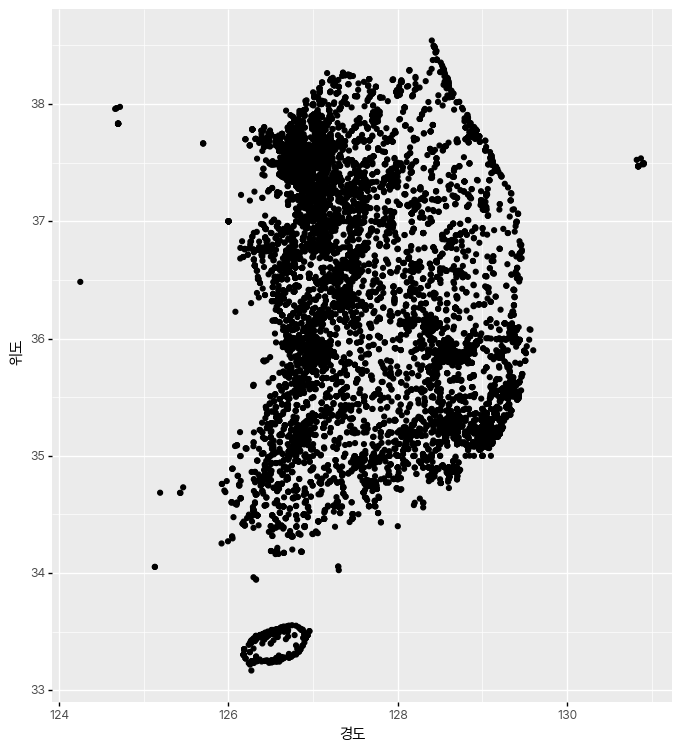

<ggplot: (184466168177)>

In [20]:
(
    ggplot(ss_2022, aes(x='경도', y='위도'))
        + geom_point()
        + theme(text=element_text(family='Pretendard'), figure_size=(8, 9))
)

In [22]:
# school_map = folium.Map(location=[ss_2022['위도'].mean(), ss_2022['경도'].mean()], zoom_start=10)

# for index, data in ss_2022.iterrows():
#     try:
#         string = '[{}] {}'.format(data['학교명'], data['학교도로명 주소'])
#         popup = folium.Popup(string, max_width=300)
#         folium.Marker(location=[data['위도'], data['경도']], popup=popup).add_to(school_map)
#     except:
#         continue

# school_map.save('./output/school_map.html')
# school_map